In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
import numpy as np
import koreanize_matplotlib 

ModuleNotFoundError: No module named 'koreanize_matplotlib'

In [ ]:
raw=pd.read_csv('.\data\mini.csv')
raw=pd.DataFrame(raw)
raw_copy=pd.DataFrame(raw)

In [4]:
raw.head()

,user_id,subscription_duration,recent_login_time,average_login_time,average_time_per_learning_session,monthly_active_learning_days,total_completed_courses,recent_learning_achievement,abandoned_learning_sessions,community_engagement_level,preferred_difficulty_level,subscription_type,customer_inquiry_history,payment_pattern,target
0,b919c29d,13,14,14.946163,8.427187,18,16,68.360455,3,4,Low,Basic,4,5,0
1,a0a60abb,16,18,18.453224,72.646087,16,13,97.567322,2,3,Medium,Basic,1,6,1
2,b9f171ae,22,1,16.195228,21.774492,13,14,94.358763,3,4,Medium,Premium,0,7,1
3,5dc0ba8b,1,19,17.628656,42.659066,19,18,70.153228,0,3,Low,Basic,1,0,1
4,65c83654,4,5,21.390656,30.744287,19,10,81.917908,2,4,Medium,Basic,3,0,1


,subscription_duration,recent_login_time,average_login_time,average_time_per_learning_session,monthly_active_learning_days,total_completed_courses,recent_learning_achievement,abandoned_learning_sessions,community_engagement_level,customer_inquiry_history,payment_pattern,target,learning_time_per_login,avg_completed_month
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,11.897400,15.013200,14.994076,54.917720,12.545400,12.227500,75.029513,3.043600,3.886100,2.010500,3.502900,0.619900,3.837355,1.996620
std,6.600896,8.362573,3.001869,56.024310,6.932239,3.634125,9.968529,1.755052,1.262175,1.420983,2.311261,0.485435,4.118120,2.738269
min,1.000000,1.000000,2.366189,0.011515,1.000000,1.000000,35.941755,0.000000,1.000000,0.000000,0.000000,0.000000,0.000666,0.043478
25%,6.000000,8.000000,13.025597,15.276611,7.000000,10.000000,68.278054,2.000000,3.000000,1.000000,1.000000,0.000000,1.025115,0.666667
50%,12.000000,15.000000,14.979228,37.578818,13.000000,12.000000,75.126061,3.000000,4.000000,2.000000,4.000000,1.000000,2.553233,1.000000
75%,18.000000,22.000000,16.995340,75.584200,19.000000,15.000000,81.718976,4.000000,5.000000,3.000000,6.000000,1.000000,5.185559,2.000000
max,23.000000,29.000000,26.998490,503.372616,24.000000,27.000000,112.643828,12.000000,5.000000,10.000000,7.000000,1.000000,50.957556,26.000000


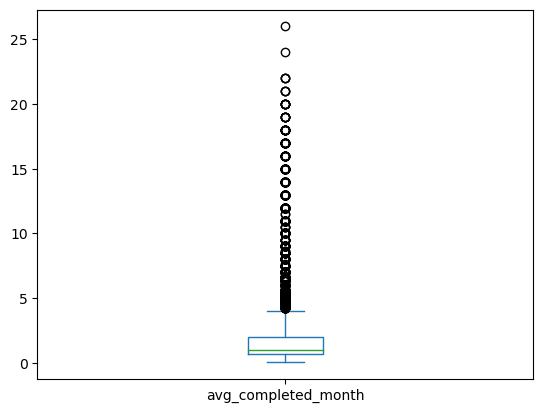

In [17]:
raw['avg_completed_month']=raw['total_completed_courses'] / raw['subscription_duration']
raw['avg_completed_month'].describe()
raw['avg_completed_month'].plot.box()
#raw.groupby('avg_completed_month')['target'== 1].value_counts()
raw.describe()

<Axes: ylabel='count'>

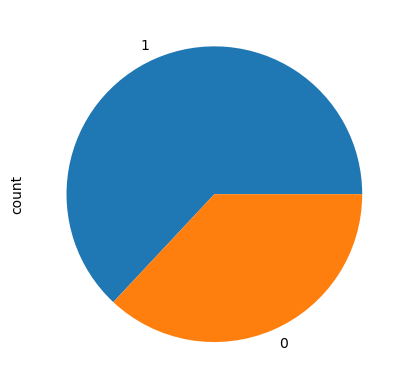

In [349]:
Q1 = raw['avg_completed_month'].quantile(0.25)
Q3 = raw['avg_completed_month'].quantile(0.75)
IQR = Q3 - Q1
#max_value = raw['avg_completed_month'].max()

upper_bound = Q3 + 1.5* IQR
#upper_bound = Q3 + 1.5 * (max_value - Q3)

#outliers_learning_time = raw[raw['avg_completed_month'] > Q3]
# Identify outliers
outliers_login_count = raw[raw['avg_completed_month'] > upper_bound #|raw['avg_completed_month'] < lower_bound)
              ]
                
t=outliers_learning_time['target'].value_counts()              

#가입기간 월평균 완료한 코스 수 아웃라이어인  cohort1

In [ ]:
raw['avg_completed_month']

C:\Users\ser\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


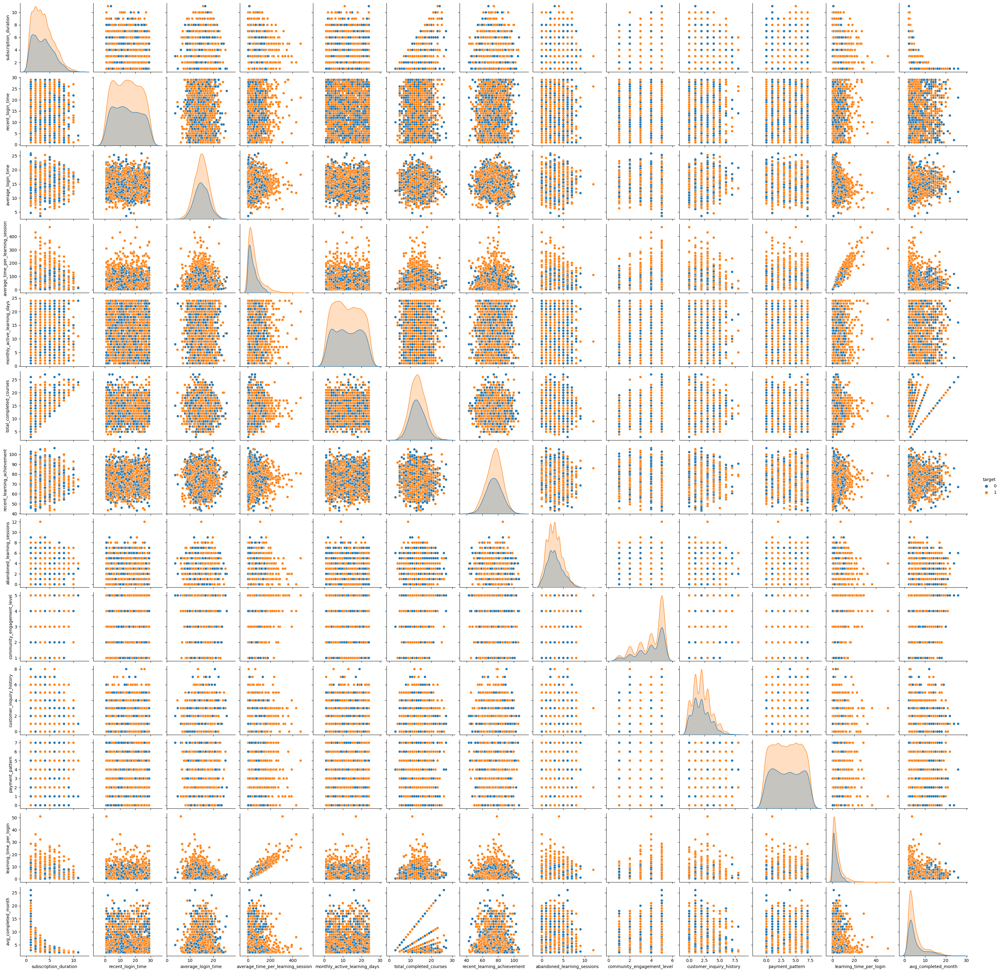

In [20]:
sns.pairplot(outliers_learning_time, hue='target')


In [2]:
raw['learning_time_per_login']= raw['average_time_per_learning_session'] / raw['average_login_time']
raw['learning_time_per_login'].describe()
raw['learning_time_per_login'].plot.box()

sns.set(style="whitegrid")
sns.boxplot(x=raw['learning_time_per_login'])

NameError: name 'raw' is not defined

In [13]:
Q1 = raw['learning_time_per_login'].quantile(0.25)
Q3 = raw['learning_time_per_login'].quantile(0.75)
Q2 = raw['learning_time_per_login'].quantile(0.50)
IQR = Q3 - Q1

upper_bound1 = Q3 + 1.5 * IQR #아웃라이어

#outliers_learn_time = raw[raw['learning_time_perlogin'] > Q3] # 75% 이상


outliers_learn_time = raw[raw['learning_time_per_login'] > upper_bound1 #|raw['avg_completed_month'] < lower_bound)
             ]
                
outliers_learn_time['target'].value_counts()   

#평균 로그인 시간대비 학습시간이 상위 25%  cohort2   +++++check

target
1    491
0     58
Name: count, dtype: int64

([<matplotlib.patches.Wedge at 0x20a86890290>,
 [Text(-1.1392288688580934, 0.1570273363472402, '5'),
  Text(0.404294365023722, -1.0230083413198865, '4'),
  Text(1.098874587135989, -0.049745771143986074, '3'),
  Text(0.7369847468786733, 0.8166109740067041, '2'),
  Text(0.19218501308512242, 1.0830812161354622, '1')],
 [Text(-0.6439119693545744, 0.08875458141365748, '45.64'),
  Text(0.22052419910384835, -0.5580045498108471, '20.70'),
  Text(0.5993861384378121, -0.027134056987628764, '15.88'),
  Text(0.40199168011563996, 0.4454241676400204, '12.19'),
  Text(0.1048281889555213, 0.5907715724375248, '5.59')])

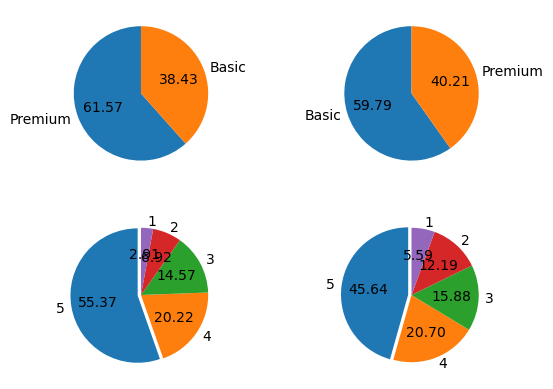

In [128]:
w=outliers_learn_time['payment_pattern'].value_counts()   
w_1 = w.sort_index()
s=outliers_learn_time['abandoned_learning_sessions'].value_counts()   
x=outliers_learn_time['subscription_type'].value_counts()   
e=outliers_learn_time['preferred_difficulty_level'].value_counts()   
d=outliers_learn_time['community_engagement_level'].value_counts()   
f=raw['community_engagement_level'].value_counts()
g=raw['subscription_type'].value_counts()
#w_1.plot.pie(startangle=-90,  autopct= '%.2f')
#s.plot()
#x.plot.bar()  #아웃라이어 구독유형
#e.plot.bar()
fig, axes = plt.subplots(2, 2,)             # 아웃라이어 커뮤니티 참여도
#x.plot.pie(startangle=180,  autopct= '%.2f',ax=axes[0])
#g.plot.pie(startangle=180,  autopct= '%.2f',ax=axes[1])
#d.plot.pie(startangle=180,  autopct= '%.2f',ax=axes[2])
#f.plot.pie(startangle=180,  autopct= '%.2f',ax=axes[3])

axes[0, 0].pie(x, startangle=90, autopct='%.2f',labels=x.index)
axes[0, 1].pie(g, startangle=90, autopct='%.2f',labels=g.index)
axes[1, 0].pie(d, startangle=90, autopct='%.2f',explode = (0.05, 0, 0, 0,0),labels=d.index)

axes[1, 1].pie(f, startangle=90, autopct='%.2f',explode = (0.05, 0, 0, 0,0),labels=f.index)

#outliers_learn_time['recent_learning_achievement'].plot.box()
#outliers_learn_time['total_completed_courses'].plot.box()

In [ ]:
percentile_cutoff = a['Value'].quantile(0.75)
a_filtered = a[a['Value'] <= percentile_cutoff]

percentile_cutoff = b['Value'].quantile(0.75)
b_filtered = b[b['Value'] <= percentile_cutoff]


<Axes: >

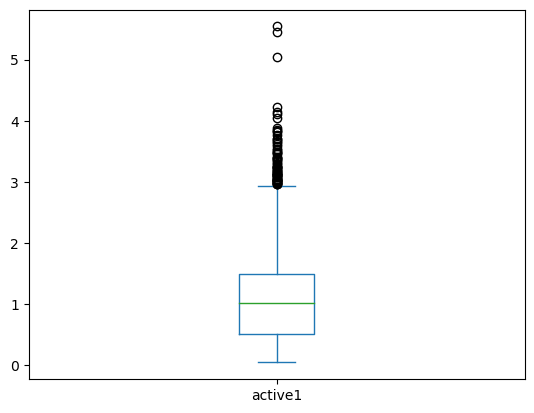

In [7]:
raw['active1']= raw['recent_login_time'] / raw['average_login_time']
raw['active1'].describe()
raw['active1'].plot.box()

In [107]:
Q1 = raw['active1'].quantile(0.25)
Q3 = raw['active1'].quantile(0.75)
IQR = Q3 - Q1

upper_bound = Q3 + 1.5 * IQR

# Identify outliers
outliers_active1 = raw[raw['active1'] > Q3 #|raw['avg_completed_month'] < lower_bound)
             ]
                
outliers_active1['target'].value_counts()  

# 평균 로그인 대비 최근 로그인이 많은 아웃라이어 cohort3

target
1    1564
0     936
Name: count, dtype: int64

In [157]:
paid=raw[raw['payment_pattern']==6]
free=raw[raw['payment_pattern']==0]

premium=raw[raw['subscription_type']=='Premium']
basic =raw[raw['subscription_type']=='Basic']

<Axes: xlabel='community_engagement_level'>

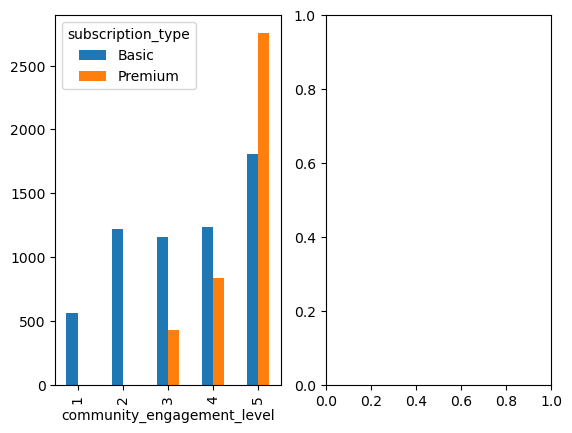

In [12]:
a=pd.pivot_table(raw, values='user_id', index='community_engagement_level', columns='subscription_type', 
aggfunc= 'count')
#b=pd.pivot_table(raw, values='user_id', index='community_engagement_level', columns='subscription_duration', 
#aggfunc= 'count')
fig, axes = plt.subplots(1, 2)
a.plot.bar(ax=axes[0])
#b.plot.bar(ax=axes[1])
#sns.heatmap(a.T,  fmt='g', cmap='viridis', #cbar=True annot=True
 #          )
# 커뮤니티 참여도 와 구독유형 graph

In [67]:
a=basic[basic['payment_pattern']==5]
a


,user_id,subscription_duration,recent_login_time,average_login_time,average_time_per_learning_session,monthly_active_learning_days,total_completed_courses,recent_learning_achievement,abandoned_learning_sessions,community_engagement_level,preferred_difficulty_level,subscription_type,customer_inquiry_history,payment_pattern,target,avg_completed_month,learning_time_perlogin,active1
0,b919c29d,13,14,14.946163,8.427187,18,16,68.360455,3,4,Low,Basic,4,5,0,1.230769,0.563836,0.936695
34,e5ab9eae,20,23,17.672267,173.153471,22,7,73.404192,4,4,Medium,Basic,1,5,1,0.350000,9.798034,1.301474
39,33319bcd,1,14,10.247550,3.882771,14,11,72.988718,3,2,Low,Basic,3,5,1,11.000000,0.378897,1.366180
45,7572ac67,4,29,15.279057,18.663997,21,11,72.623031,1,5,High,Basic,5,5,1,2.750000,1.221541,1.898023
56,1650d00f,21,20,18.910968,11.570615,17,11,68.865930,5,4,Medium,Basic,5,5,1,0.523810,0.611847,1.057587
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9923,e3eee90e,8,22,21.428629,105.130977,3,8,80.528708,3,5,Low,Basic,0,5,1,1.000000,4.906099,1.026664
9939,85c281b8,3,3,16.153410,39.983632,20,12,91.507165,4,2,Low,Basic,4,5,1,4.000000,2.475244,0.185719
9951,de2754f7,21,22,16.108321,262.126094,8,9,70.677943,5,5,Low,Basic,1,5,1,0.428571,16.272714,1.365754
9960,4ddde6d3,2,24,11.412968,28.240429,11,5,74.208750,2,3,High,Basic,2,5,1,2.500000,2.474416,2.102871


C:\Users\ser\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


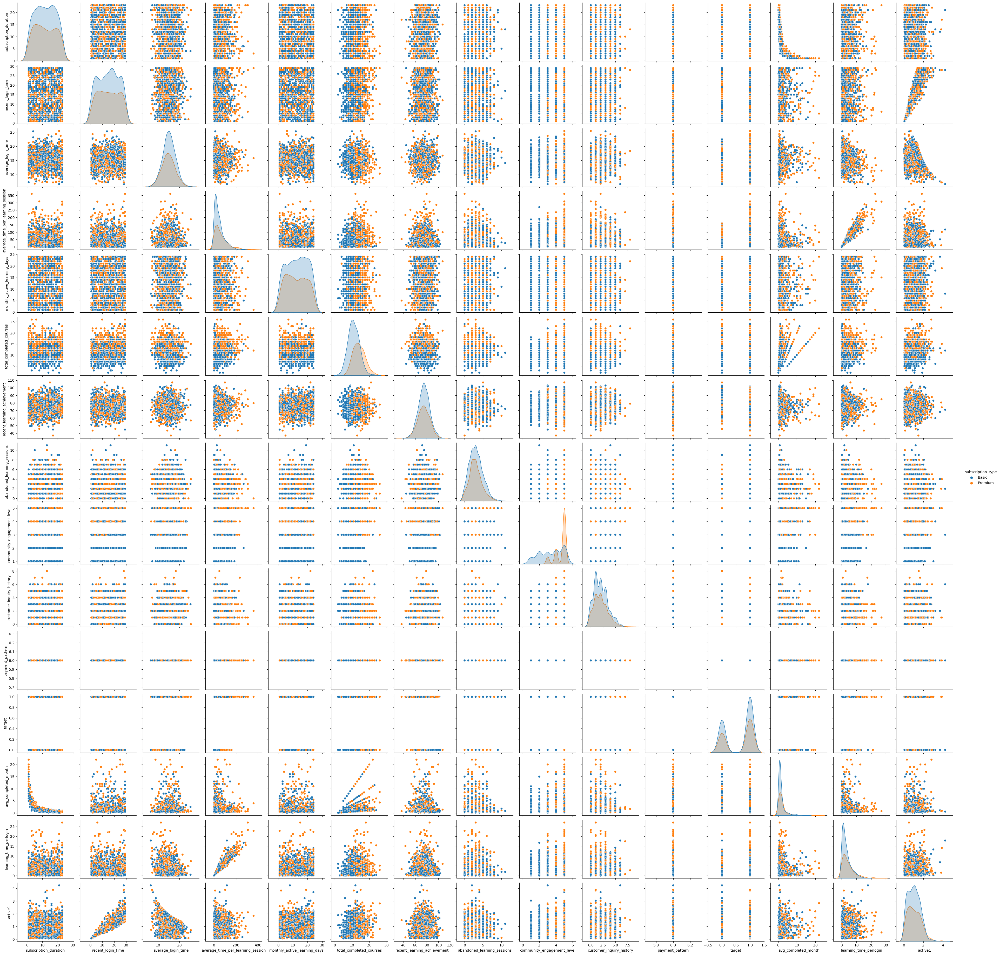

In [9]:
sns.pairplot(paid, hue='subscription_type')

C:\Users\ser\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


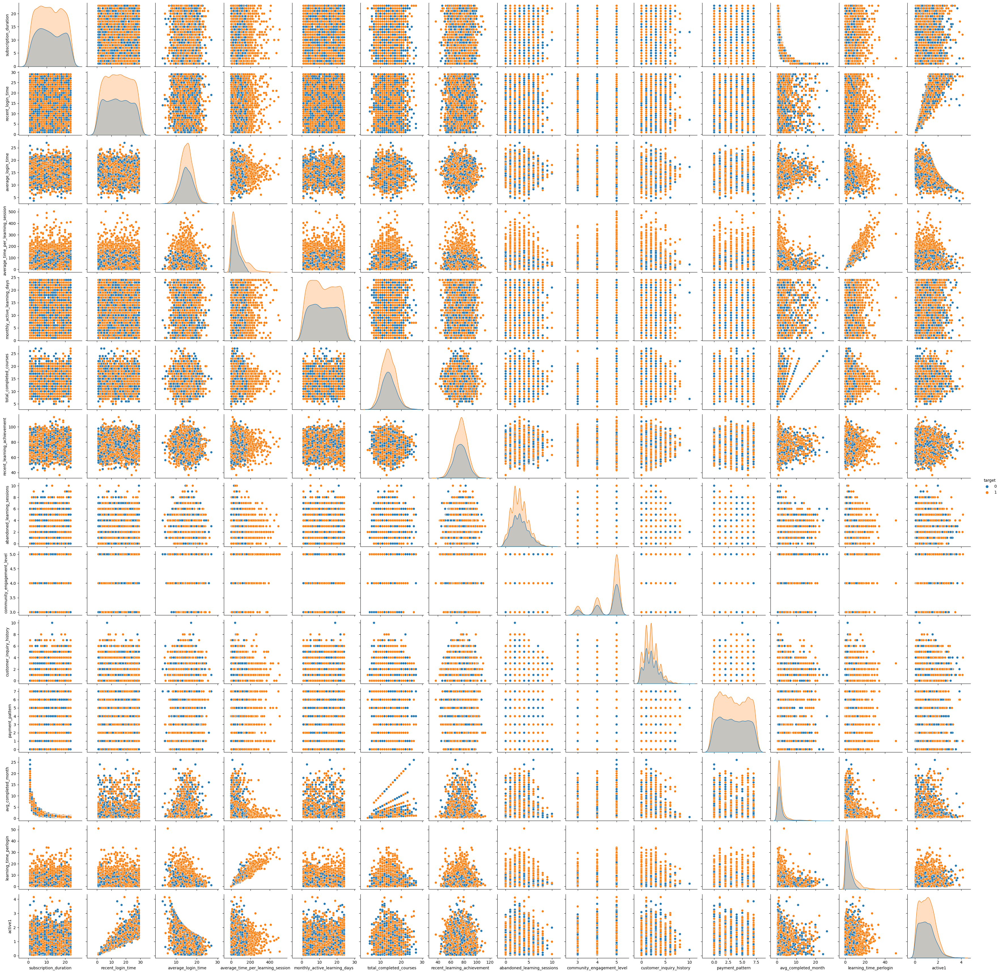

In [17]:
sns.pairplot(premium, hue='target')

,user_id,subscription_duration,recent_login_time,average_login_time,average_time_per_learning_session,monthly_active_learning_days,total_completed_courses,recent_learning_achievement,abandoned_learning_sessions,community_engagement_level,preferred_difficulty_level,subscription_type,customer_inquiry_history,payment_pattern,target,learning_time_per_login,avg_completed_month
count,4021,4021.000000,4021.000000,4021.000000,4021.000000,4021.000000,4021.000000,4021.000000,4021.000000,4021.000000,4021,4021,4021.000000,4021.000000,4021.000000,4021.000000,4021.000000
unique,4021,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,1,NaN,NaN,NaN,NaN,NaN
top,b9f171ae,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Low,Premium,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1983,4021,NaN,NaN,NaN,NaN,NaN
mean,NaN,11.874161,14.827904,15.024400,64.606718,12.400398,14.029346,74.944263,3.040040,4.578960,NaN,NaN,1.996767,3.429993,0.625715,4.507117,2.261902
std,NaN,6.576574,8.350066,3.050996,64.254071,6.976638,3.323613,9.979065,1.705169,0.676577,NaN,NaN,1.421666,2.312928,0.483998,4.736522,3.019261
min,NaN,1.000000,1.000000,3.636424,0.011515,1.000000,4.000000,36.830979,0.000000,3.000000,NaN,NaN,0.000000,0.000000,0.000000,0.000972,0.181818
25%,NaN,6.000000,8.000000,13.014758,18.695972,6.000000,12.000000,68.021218,2.000000,4.000000,NaN,NaN,1.000000,1.000000,0.000000,1.232312,0.785714
50%,NaN,12.000000,15.000000,15.015185,44.837323,12.000000,14.000000,75.127553,3.000000,5.000000,NaN,NaN,2.000000,3.000000,1.000000,3.023881,1.200000
75%,NaN,18.000000,22.000000,17.031405,90.860809,19.000000,16.000000,81.689025,4.000000,5.000000,NaN,NaN,3.000000,5.000000,1.000000,6.180426,2.200000


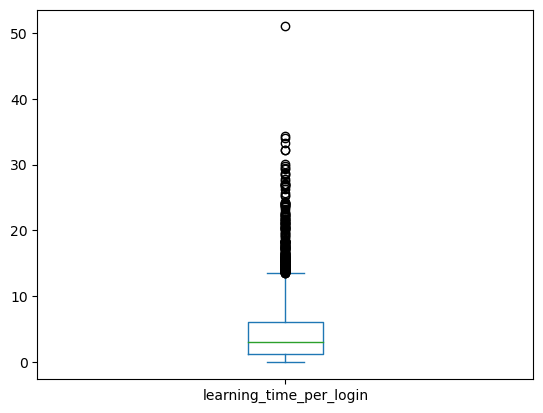

In [186]:
premium['learning_time_per_login'].plot.box()
premium.describe(include='all')
#프리미엄 중 러닝타임 아웃라이어 찾기

In [277]:

Q1 =raw['learning_time_per_login'].quantile(0.25)
Q3 = raw['learning_time_per_login'].quantile(0.75)

IQR = Q3 - Q1

upper_bound = Q3 + 1.5 * IQR #아웃라이어

#outliers_learn_time = raw[raw['learning_time_per_login'] > Q3] # 75% 이상


outliers_learn_time = raw[ raw['learning_time_per_login'] > upper_bound #|raw['avg_completed_month'] < lower_bound)
             ]
                
r=outliers_learn_time['target'].value_counts()   

## 전체 중 아웃라이어 세션 구독예상 비율 
r


target
1    491
0     58
Name: count, dtype: int64

Text(0.5, 1.0, 'All Users')

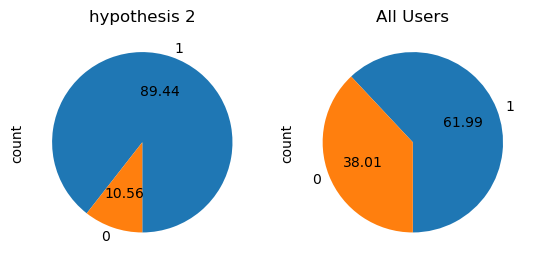

In [278]:
  
fig, axes = plt.subplots(1, 2)

r.plot.pie(autopct= '%.2f',startangle=-90,ax=axes[0])
axes[0].set_title("hypothesis 2")

x=raw['target'].value_counts()
x.plot.pie(autopct= '%.2f',startangle=-90,ax=axes[1])
axes[1].set_title("All Users")

In [237]:
#a=premium['learning_time_per_login'].value_counts()


Q1 =premium['learning_time_per_login'].quantile(0.25)
Q3 = premium['learning_time_per_login'].quantile(0.75)

IQR = Q3 - Q1

upper_bound1 = Q3 + 1.5 * IQR #아웃라이어

#outliers_learn_time_p = raw[raw['learning_time_per_login'] > Q3] # 75% 이상


outliers_learn_time_p = premium[ premium['learning_time_per_login'] > upper_bound1 #|raw['avg_completed_month'] < lower_bound)
             ]
                
outliers_learn_time_p['target'].value_counts()   

# 프리미엄 군집 중 러닝 시간이 75% 군집 이상 1359/601 69.33%
# 프리미엄 군집 중 러닝 시간이  아웃라이어 208/9 95.8%





target
1    208
0      9
Name: count, dtype: int64

In [238]:

Q1 =basic['learning_time_per_login'].quantile(0.25)
Q3 = basic['learning_time_per_login'].quantile(0.75)

IQR = Q3 - Q1

upper_bound2 = Q3 + 1.5 * IQR #아웃라이어

#outliers_learn_time_b = raw[raw['learning_time_per_login'] > Q3] # 75% 이상


outliers_learn_time_b = basic[ basic['learning_time_per_login'] > upper_bound2 #|raw['avg_completed_month'] < lower_bound)
             ]
                
outliers_learn_time_b['target'].value_counts()   

# 베이직 군집 중 러닝 시간이 75% 군집 이상 1914/988 65.95%
# 베이직 군집 중 러닝 시간이 아웃라이어 248/55 81.84%


target
1    248
0     55
Name: count, dtype: int64

Text(0.5, 1.0, 'All Users')

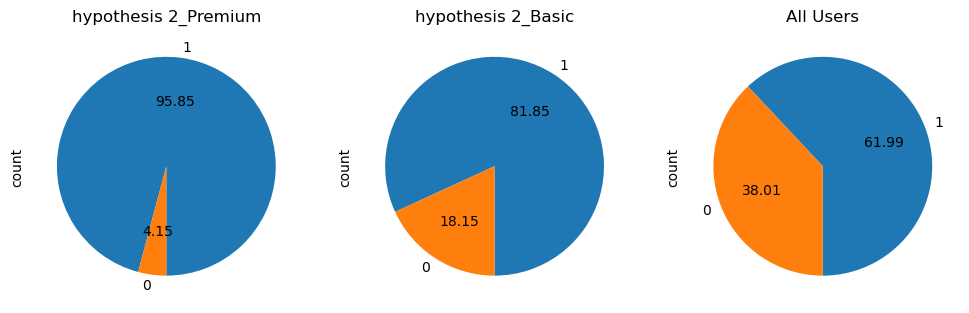

In [283]:
  
fig, axes = plt.subplots(1, 3,figsize=(12, 5))
p=outliers_learn_time_p['target'].value_counts() 
p.plot.pie(autopct= '%.2f',startangle=-90,ax=axes[0])
axes[0].set_title("hypothesis 2_Premium")

b=outliers_learn_time_b['target'].value_counts()  
b.plot.pie(autopct= '%.2f',startangle=-90,ax=axes[1])
axes[1].set_title("hypothesis 2_Basic")

x=raw['target'].value_counts()
x.plot.pie(autopct= '%.2f',startangle=-90,ax=axes[2])
axes[2].set_title("All Users")


# 가설 2 -2 


In [150]:
#paid=raw[raw['payment_pattern']==5]


Q1 =paid['learning_time_per_login'].quantile(0.25)
Q3 = paid['learning_time_per_login'].quantile(0.75)

IQR = Q3 - Q1

#upper_bound1 = Q3 + 1.5 * IQR #아웃라이어

outliers_learn_time_p = raw[raw['learning_time_per_login'] > Q3] # 75% 이상


#outliers_learn_time_p = paid[ paid['learning_time_per_login'] > upper_bound1 #|raw['avg_completed_month'] < lower_bound)
 #            ]
                
outliers_learn_time_p['target'].value_counts()   

## 결제 패턴 별 아웃라이어 세션 구독예상 비율 

target
1    1664
0     807
Name: count, dtype: int64

In [55]:
learning_paid= pd.pivot_table(raw, values='user_id',   #values : 열에 들어 가는 부분
                       index=['payment_pattern'], #index : 행에 들어가는 부분
                       columns=['target'],  
                       aggfunc="count"
                             )
learning_paid_ratio = (learning_paid[1])/ (learning_paid[0]) 
learning_paid_ratio

payment_pattern
0    1.724359
1    1.559761
2    1.627451
3    1.633833
4    1.633406
5    1.536885
6    1.715203
7    1.625767
dtype: float64

In [1]:
level_active= pd.pivot_table(premium, values='user_id',   #values : 열에 들어 가는 부분
                       index=['customer_inquiry_history'], #index : 행에 들어가는 부분
                       columns=['community_engagement_level'],  
                       aggfunc="count")
level_active=level_active.fillna(0)

sns.heatmap(level_active)

# 프리미엄 회원 중 커뮤니티 - 문의 내역 히트맵

NameError: name 'pd' is not defined

<Axes: xlabel='community_engagement_level'>

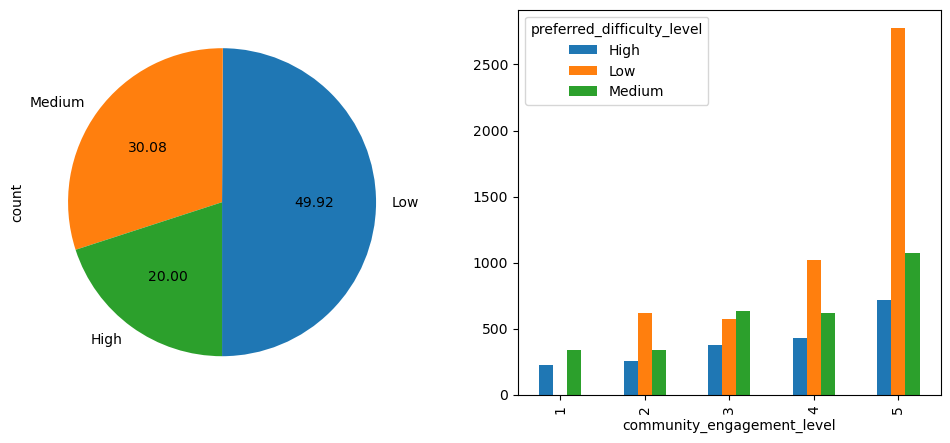

In [64]:
a=pd.pivot_table(raw, values='user_id', index='community_engagement_level', columns= 'preferred_difficulty_level', #'payment_pattern', 
aggfunc= 'count' )
j=raw['preferred_difficulty_level'].value_counts()

fig, axes = plt.subplots(1, 2,figsize=(12, 5))

j.plot.pie(startangle=-90,  autopct= '%.2f',ax=axes[0],)
a.plot.bar(ax=axes[1],)

# 커뮤니티 상관도

<Axes: ylabel='count'>

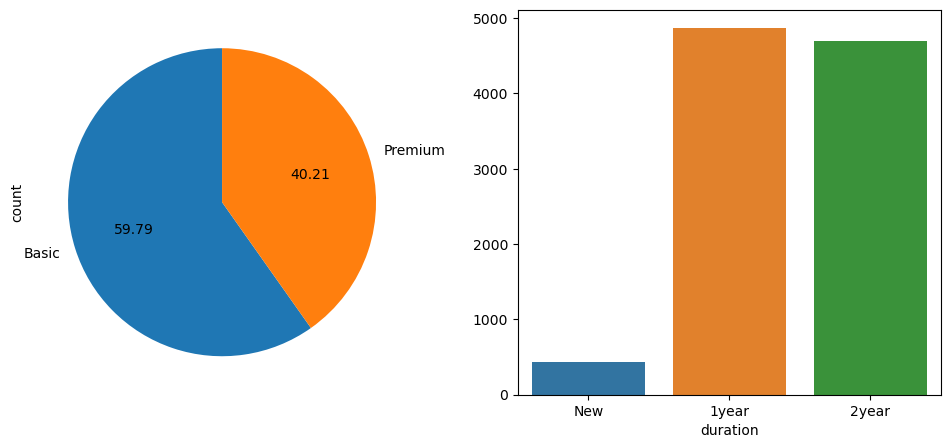

In [120]:
cut=[0,1, 12, 24]
raw['duration']=pd.cut(raw['subscription_duration'], cut, labels=['New', '1year', '2year',])
a=raw['duration'].value_counts()
#sns.barplot(x=a.index, y=a.values)
#plt.title('Subscription Duration')

fig, axes = plt.subplots(1, 2,figsize=(12, 5))
#plt.title('Subscription Duration')
sns.barplot(x=a.index, y=a.values,ax=axes[1],)

#sns.barplot(y=raw['subscription_type'].index, x=raw['subscription_type'].values, ax=axes[1])
b=raw['subscription_type'].value_counts()
b.plot.pie(startangle=90, autopct= '%.2f', ax=axes[0], title=False )
#sns.barplot(x=b.index, y=b.values, ax=axes[0],)

In [122]:
raw['duration'].value_counts()


duration
1year    4868
2year    4696
New       436
Name: count, dtype: int64

<Axes: xlabel='subscription_duration'>

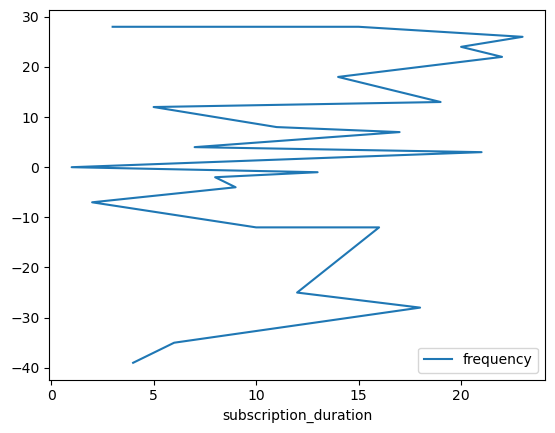

In [19]:
a=436-raw['subscription_duration'].value_counts()
a
retention = pd.DataFrame({'frequency': a.values},index=a.index)
retention.plot()

# 리텐션 계산 해보기??

<Axes: title={'center': 'payment count(within 3 month)'}, xlabel='payment_pattern'>

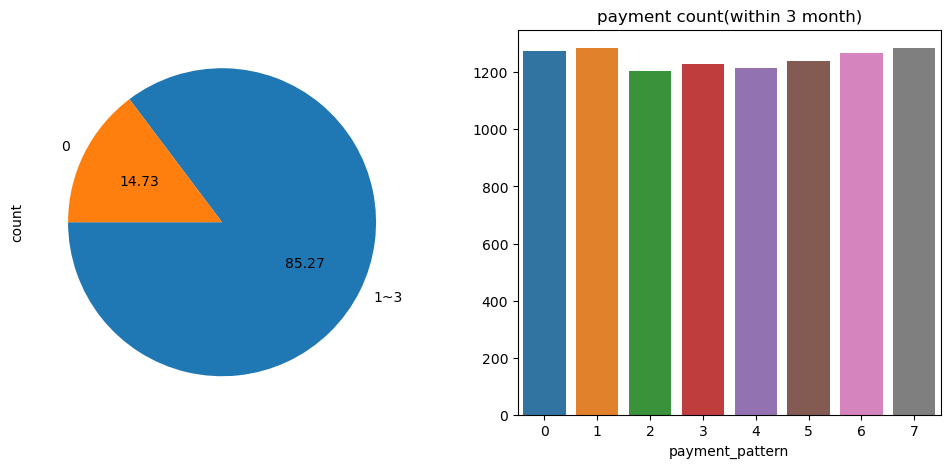

In [197]:
cut=[0,1,7]
raw['payment']=pd.cut(raw['payment_pattern'], cut, labels=['0', '1~3',])
a=raw['payment'].value_counts()
b=raw['payment_pattern'].value_counts()
fig, axes = plt.subplots(1, 2,figsize=(12, 5))
a.plot.pie(autopct= '%.2f',startangle=180,ax=axes[0])
plt.title('payment count(within 3 month)')

sns.barplot(x=b.index, y=b.values, ax=axes[1], )

In [3]:



#low= raw[raw['preferred_difficulty_level']=='Low']
#low_premi=low[low['subscription_type']=='Premium']
#low_premi_com= low_premi[low_premi['community_engagement_level']==5]
#low_premi_com

#a= raw[raw['preferred_difficulty_level']=='Low']
#b=raw[raw['subscription_type']=='Premium']
#c= raw[raw['community_engagement_level']==5]

outliers_learn_time_p
premium

cohort = raw[
    #(raw['preferred_difficulty_level'] == 'Low') &
    (raw['subscription_type'] == 'Premium') &
    #(raw['payment_pattern'] == 7) &
    #(raw['learning_time_per_login'] >=5.19) &
    (raw['new_payment_pattern']=='Before 3M')
]

#cohort['preferred_difficulty_level'].value_counts()
a=cohort['target'].value_counts()
a.plot.pie(autopct= '%.2f',startangle=-90)
#.describe()
# low 레벨 선호 & premium 구독 & 커뮤니케이션 참여도 3이상 & 로긴시간 아웃라이어 70.19% 타켓



NameError: name 'outliers_learn_time_p' is not defined

Text(0.5, 1.0, 'All Users')

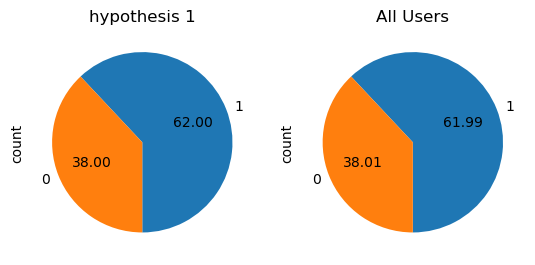

In [267]:


fig, axes = plt.subplots(1, 2)
a=cohort['target'].value_counts()
a.plot.pie(autopct= '%.2f',startangle=-90,ax=axes[0])
axes[0].set_title("hypothesis 1")

x=raw['target'].value_counts()
x.plot.pie(autopct= '%.2f',startangle=-90,ax=axes[1])
axes[1].set_title("All Users")

## 가설 1

<Axes: xlabel='payment_pattern'>

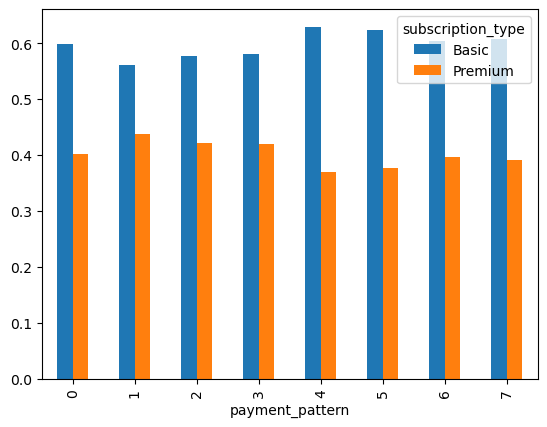

In [227]:
a=raw.groupby('payment_pattern')['subscription_type'].count()
a=pd.pivot_table(raw, values='user_id', index='payment_pattern', columns='subscription_type',aggfunc= 'count')
a.plot.bar()

In [206]:
Q1 = free['learning_time_per_login'].quantile(0.25)
Q3 = free['learning_time_per_login'].quantile(0.75)
IQR = Q3 - Q1

upper_bound = Q3 + 1.5 * IQR

# Identify outliers
outliers_active1 = free[free['recent_learning_achievement'] > upper_bound #|raw['avg_completed_month'] < lower_bound)
             ]
                
outliers_active1['target'].value_counts()  

#paid 801/467 63.17%
#free 807/468 63.29%

##프리미엄 베이직 계산 가능


target
1    807
0    468
Name: count, dtype: int64

<Axes: xlabel='preferred_difficulty_level'>

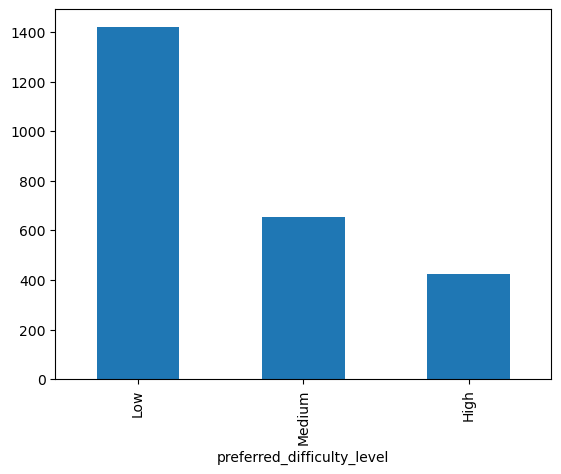

In [183]:
a=raw[raw['learning_time_per_login'] >=5.19]
f=a['preferred_difficulty_level'].value_counts()
f.plot.bar()


<Axes: ylabel='count'>

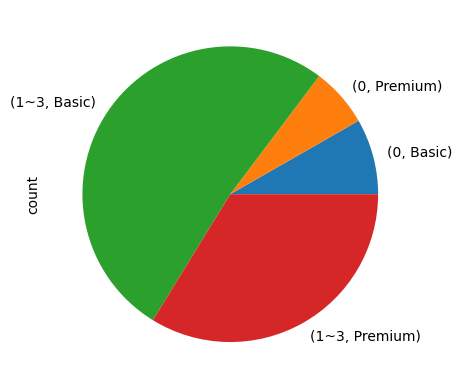

In [202]:
a=raw['payment'].value_counts()
b=raw.groupby('payment')['subscription_type'].value_counts()
b.plot.pie()

,user_id,subscription_duration,recent_login_time,average_login_time,average_time_per_learning_session,monthly_active_learning_days,total_completed_courses,recent_learning_achievement,abandoned_learning_sessions,community_engagement_level,preferred_difficulty_level,subscription_type,customer_inquiry_history,payment_pattern,target,learning_time_per_login,avg_completed_month,payment
1,a0a60abb,16,18,18.453224,72.646087,16,13,97.567322,2,3,Medium,Basic,1,6,1,3.936769,0.812500,1~3
2,b9f171ae,22,1,16.195228,21.774492,13,14,94.358763,3,4,Medium,Premium,0,7,1,1.344501,0.636364,1~3
4,65c83654,4,5,21.390656,30.744287,19,10,81.917908,2,4,Medium,Basic,3,0,1,1.437276,2.500000,NaN
5,b7586b82,4,4,17.274007,34.034189,21,8,74.371028,2,4,High,Basic,5,7,0,1.970254,2.000000,1~3
8,9e6713d2,20,4,12.624582,37.384210,8,8,63.624395,4,4,High,Basic,0,0,1,2.961224,0.400000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9985,8fcca29a,11,15,16.384857,26.838931,21,6,72.500642,1,5,Medium,Basic,4,1,1,1.638033,0.545455,0
9987,ec7013a5,21,7,17.466408,160.590536,14,14,76.861836,4,5,Medium,Premium,2,2,0,9.194251,0.666667,1~3
9991,6ab018ed,12,25,12.730692,58.407028,2,8,64.614196,1,3,High,Basic,3,6,1,4.587891,0.666667,1~3
9994,9ee4e40c,11,6,11.187836,88.757610,6,9,77.335911,5,4,High,Basic,1,4,1,7.933403,0.818182,1~3


Text(0.5, 1.0, 'Subscription Period User Volatility')

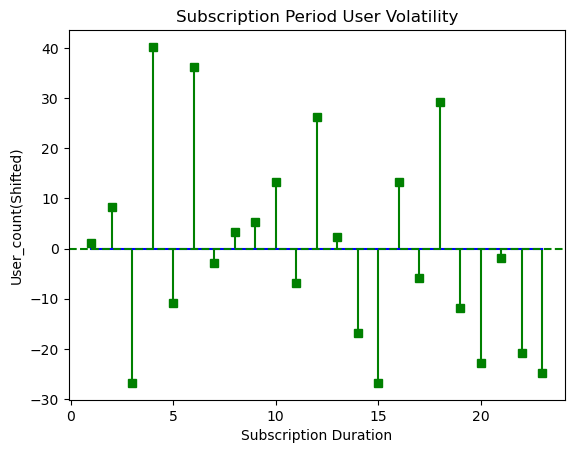

In [305]:



a=raw['subscription_duration'].value_counts()
values = a.index
counts = a.values

mean_value = counts.mean()

# Subtract mean value from counts to shift the plot
shifted_counts = counts - mean_value

# Create a stem plot with the shifted counts
plt.stem(values, shifted_counts, basefmt='b', linefmt='g', markerfmt='gs')

# Add a horizontal line at y=0 (mean value)
plt.axhline(0, color='g', linestyle='--', label='Mean')
mean_value

plt.xlabel('Subscription Duration')
plt.ylabel('User_count(Shifted)')
plt.title('Subscription Period User Volatility')

In [307]:
list=[]

for x in raw['payment_pattern']:
    if x==0:
        list.append('free')
    elif x == 1 or x == 3 or x == 5 or x == 7 :
        list.append('Before 1M')
    elif x == 2 or x == 3 or x == 6 or x == 7:
        list.append('Before 2M')
    elif  x == 4 or x == 5 or x == 6 or x == 7 :
        list.append('Before 3M')
    else: 
        list.append('unknown')
    
raw['new_payment_pattern'] = list


In [315]:
raw['new_payment_pattern']
#b=raw.groupby('new_payment_pattern')['subscription_type'].value_counts()
#b.plot.pie()

0       Before 1M
1       Before 2M
2       Before 1M
3            free
4            free
          ...    
9995    Before 1M
9996    Before 1M
9997    Before 2M
9998         free
9999    Before 1M
Name: new_payment_pattern, Length: 10000, dtype: object

In [320]:
raw['new_payment_pattern']=='2M'

0       False
1       False
2       False
3       False
4       False
        ...  
9995    False
9996    False
9997    False
9998    False
9999    False
Name: new_payment_pattern, Length: 10000, dtype: bool